In [2]:
import numpy as np
import numpy.linalg as lg
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

## First Dataset: Brain1

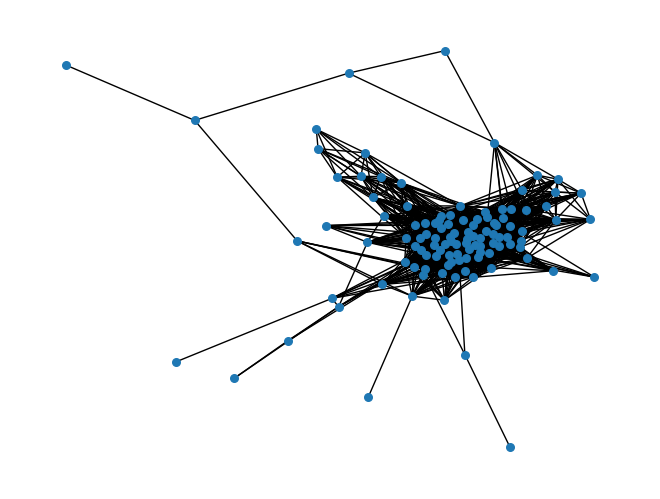

In [272]:
G = nx.read_weighted_edgelist('Brain1.txt')
plt.clf()
nx.draw(G, node_size=30)
plt.show()
A=nx.to_numpy_array(G)

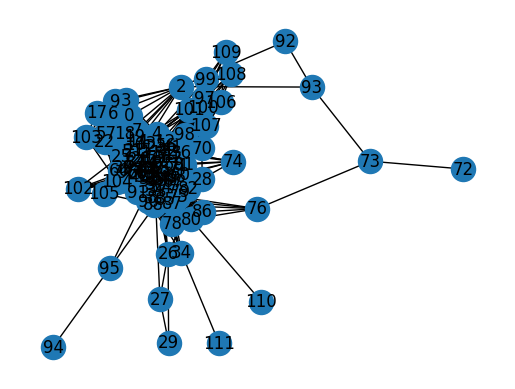

[25. 57. 11. 16. 58. 60. 19. 48. 65. 16. 65. 68. 63. 70. 60. 72. 77. 15.
 43. 53. 67. 69. 30. 62. 70. 47.  8.  3. 22.  2. 73. 67. 70. 69.  8. 65.
 62. 69. 72. 54. 62. 64. 59. 73. 73. 66. 73. 76. 71. 68. 69. 70. 71. 74.
 67. 66. 66. 23. 70. 66. 62. 65. 72. 75. 72. 69. 47. 56. 64. 69. 17. 61.
  1.  3.  8. 45.  6. 56. 18. 44. 24. 54. 35. 49. 63. 46. 16. 42. 39. 72.
 44. 49.  2.  3.  1.  3. 53. 14. 36. 10. 16. 21.  6. 14. 38. 15. 12. 20.
  8.  6.  1.  1.]


In [273]:
#Redraw network graph to order node labelling in adjacency matrix.
G = nx.from_numpy_array(A)
plt.clf()
pos = nx.spring_layout(G)
nx.draw_networkx(G)
#nx.draw_networkx_edges(G,pos)
plt.axis('off')
#plt.savefig("pth2.png")
plt.show()

#Define some vector quantities
n = len(A)
e = np.ones(n)
k = np.dot(A,e)
print(k)

# Question 1

In [274]:
# Use the eigenvalues to calculate the number of triangles in G and also
# the number of closed walks of length 4 and 5.
u,v = lg.eigh(A)
C3 = sum(u**3)/6  # Number of triangles

print('Number of triangles:', C3)
print('Number of closed walks of length 4:',sum(u**4))
print('Number of closed walks of length 5:',sum(u**5))

Number of triangles: 38025.999999999985
Number of closed walks of length 4: 13600391.999999993
Number of closed walks of length 5: 816264199.9999994


### Eigenvalues

In [275]:
u

array([-8.83726596e+00, -7.30151543e+00, -7.13084303e+00, -5.54004151e+00,
       -5.37680510e+00, -5.28863408e+00, -4.82787534e+00, -4.51984050e+00,
       -4.35460033e+00, -4.32914556e+00, -4.11636661e+00, -4.08126937e+00,
       -3.92057777e+00, -3.57745311e+00, -3.46334239e+00, -3.39757280e+00,
       -3.35382570e+00, -3.15460353e+00, -3.14378620e+00, -3.01716517e+00,
       -2.85361910e+00, -2.76914770e+00, -2.65533833e+00, -2.62152591e+00,
       -2.46073919e+00, -2.42338823e+00, -2.37225382e+00, -2.28851150e+00,
       -2.21940036e+00, -2.18630348e+00, -2.12924916e+00, -2.10116542e+00,
       -1.98143791e+00, -1.94824709e+00, -1.88351464e+00, -1.79161174e+00,
       -1.72421658e+00, -1.67081691e+00, -1.63449250e+00, -1.55117072e+00,
       -1.50809437e+00, -1.43612129e+00, -1.35027549e+00, -1.30792224e+00,
       -1.22959439e+00, -1.22184730e+00, -1.19652879e+00, -1.13177459e+00,
       -1.08400487e+00, -1.05458762e+00, -1.04811380e+00, -9.97380753e-01,
       -9.88731884e-01, -

In [276]:
print("Second-largest positive eigenvalue:", u[-2])

Second-largest positive eigenvalue: 17.73919254228603


### Eigenvectors associated with the Second-largest positive eigenvalue 

In [277]:
v[:,-2]

array([-1.77903098e-01, -1.09702960e-01, -8.55764507e-02, -1.38537409e-01,
       -1.51692970e-01, -1.51578553e-01, -1.47555241e-01, -1.98523723e-01,
       -8.42679986e-02, -1.36938719e-01, -1.65406279e-01, -6.61357692e-02,
       -7.28403098e-02, -1.41220517e-01, -1.70852134e-01, -1.20918635e-01,
       -2.38493289e-02, -1.32365904e-01, -2.06484114e-01, -1.95390847e-01,
       -6.38127961e-02, -1.30906815e-01, -1.75000180e-01, -8.06044355e-02,
       -7.45693887e-02, -1.31125826e-01,  1.26636440e-02,  3.79118269e-03,
        2.74196696e-02,  9.27597276e-04,  2.54168578e-02,  5.36612784e-02,
        4.92987235e-02,  3.13176939e-02,  3.28098160e-02,  1.06555639e-01,
        2.52016827e-02,  5.69833933e-02,  1.92968325e-02, -4.98376734e-02,
        7.79836452e-03, -1.55236267e-02, -5.30758585e-02,  1.87982922e-02,
        3.46685535e-03, -3.97552803e-02,  7.08398708e-02,  1.07302654e-02,
        3.25882639e-02,  1.05673598e-01,  9.75847458e-02, -2.95336826e-02,
        3.22929637e-02,  

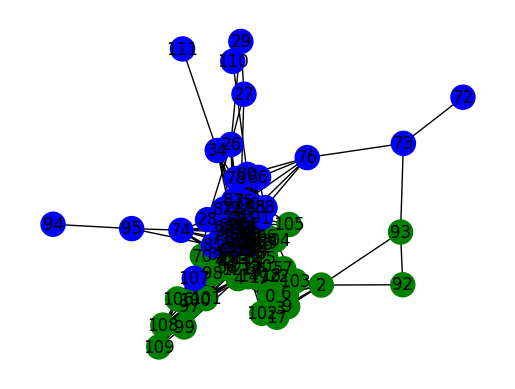

In [278]:
P=v[:,-2]                      # Put eigenvector here
C1 = np.where(P>0)[0]          # C1 is a vector of indices of P which are positive
C2 = np.where(P<=0)[0]         # C2 is a vector of indices of P which are non-positive
colour = np.tile('g',n)        # Default colour is green
colour[C1] = 'b'               # Turn one partition blue
plt.clf()
nx.draw_networkx(G,pos,node_color = colour)
plt.axis('off')
# plt.savefig('ass.png')
plt.show()

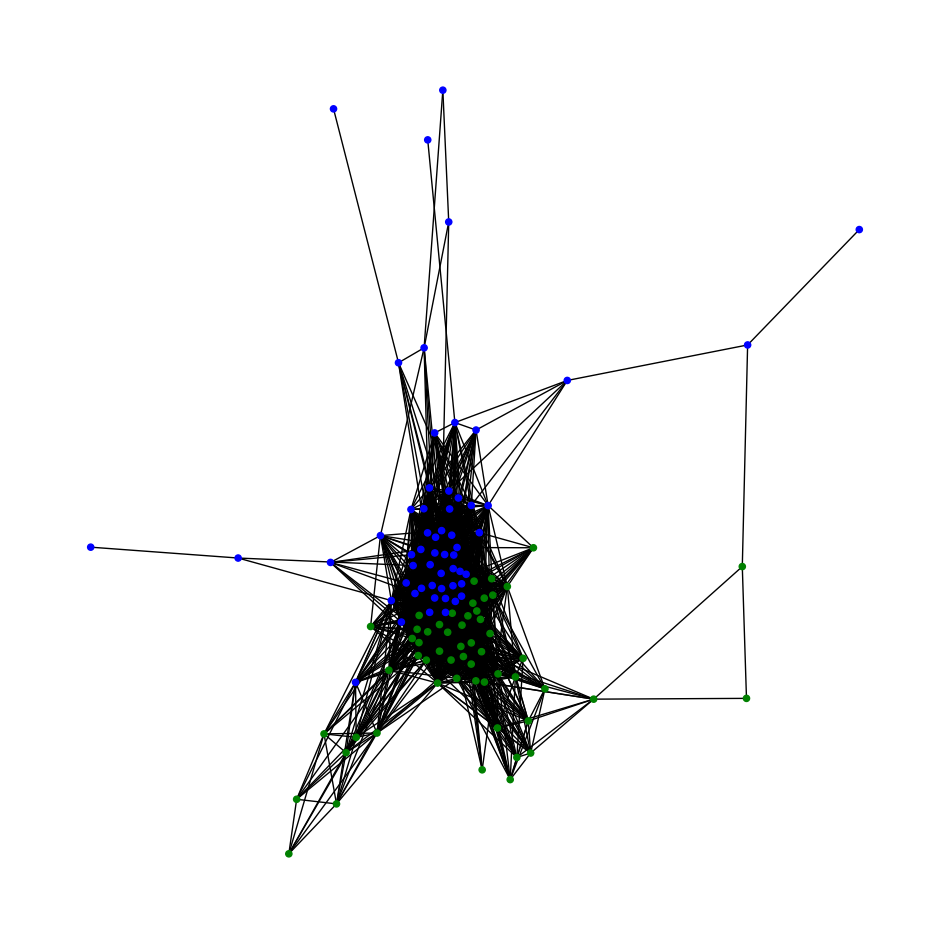

In [279]:
plt.figure(figsize=(12, 12))
plt.clf()
nx.draw_networkx(G, pos, node_color=colour, node_size=20, with_labels=False)
plt.axis('off')
plt.show()

In [239]:
# 4) count edges within each and between
within_C1 = G.subgraph(C1).number_of_edges()
within_C2 = G.subgraph(C2).number_of_edges()
between = sum(
    1 for i, j in G.edges()
    if (i in C1 and j in C2) or (i in C2 and j in C1)
)

print(f"Community 1 (|C1|={len(C1)}) has {within_C1} edges")
print(f"Community 2 (|C2|={len(C2)}) has {within_C2} edges")
print(f"Edges between communities: {between}")

Community 1 (|C1|=57) has 839 edges
Community 2 (|C2|=55) has 702 edges
Edges between communities: 959


### Number of edges within community 1

In [240]:
np.sum(A[np.ix_(C1,C1)])/2

839.0

### Number of edges within community 2

In [241]:
np.sum(A[np.ix_(C2,C2)])/2

702.0

### Number of total edges within the two communities 

In [242]:
(np.sum(A[np.ix_(C1,C1)])+np.sum(A[np.ix_(C2,C2)]))/2

1541.0

### Number of edges **between** the two communities

In [243]:
np.sum(A[np.ix_(C1,C2)])

959.0

### Total number of communities in the network

In [244]:
total_edges = np.sum(A)/2
total_edges

2500.0

# Question 2

### Watts–Strogatz clustering coefficient

In [245]:
C_ws = nx.average_clustering(G)
print("Watts–Strogatz clustering coefficient (C):", C_ws)

Watts–Strogatz clustering coefficient (C): 0.7564750622497216


### Total number of triangles ($C_3$) and squares ($C_4$)

In [246]:
C4 = (np.sum(u**4) - 2*(total_edges) - 4*(C3)) / 8

print('Number of triangles (C3):', C3)
print("Number of squares (C4):", C4)

Number of triangles (C3): 38025.999999999985
Number of squares (C4): 1680410.9999999993


In [247]:
m = np.sum(A)/2
p = 2*m/(n*(n-1))

# Erdős–Rényi graph metric
metrics = []
for seed in range(60):
    G_er = nx.erdos_renyi_graph(n, p, seed=seed)
    A_er = nx.to_numpy_array(G_er)
    C_er = nx.average_clustering(G_er)
    u_er, v_er = lg.eigh(A_er)
    C3_er   = np.sum(u_er**3)/6
    C4_er   = (np.sum(u_er**4) - 2*(np.sum(A2)/2) - 4*C3_er)/8
    metrics.append({'clustering': C_er, 'triangles': C3_er, 'squares': C4_er})
    
df = pd.DataFrame(metrics)

print("\n### Real vs ER Erdős–Rényi (60 samples):")
print("| Metric        | Real  | ER Avg.   |")
print("|---------------|------:|----------:|")
print(f"| Clustering    | {C_ws:.4f} | {df['clustering'].mean():.4f}   |")
print(f"| Triangles     | {int(C3)} | {df['triangles'].mean():.1f}   |")
print(f"| Squares       | {int(C4)} | {df['squares'].mean():.1f} |")


### Real vs ER Erdős–Rényi (60 samples):
| Metric        | Real  | ER Avg.   |
|---------------|------:|----------:|
| Clustering    | 0.7565 | 0.4022   |
| Triangles     | 38025 | 14803.6   |
| Squares       | 1680410 | 534325.8 |


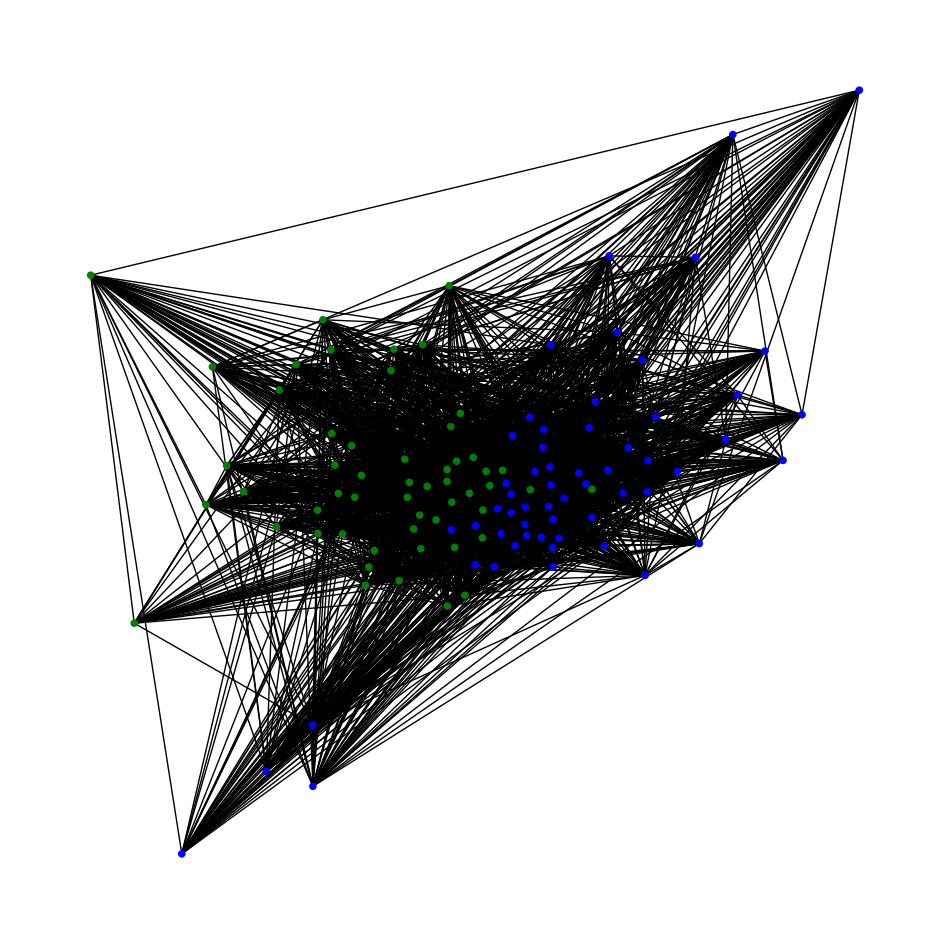

In [310]:
plt.figure(figsize=(12, 12))
plt.clf()
nx.draw_networkx(G_er, pos, node_color=colour, node_size=20, with_labels=False)
plt.axis('off')
plt.show()

In [248]:
A@A@A

array([[4.820e+02, 1.032e+03, 1.900e+02, ..., 1.000e+01, 0.000e+00,
        0.000e+00],
       [1.032e+03, 2.720e+03, 2.840e+02, ..., 2.900e+01, 9.000e+00,
        2.000e+00],
       [1.900e+02, 2.840e+02, 7.400e+01, ..., 1.000e+00, 0.000e+00,
        0.000e+00],
       ...,
       [1.000e+01, 2.900e+01, 1.000e+00, ..., 3.000e+01, 0.000e+00,
        0.000e+00],
       [0.000e+00, 9.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 2.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00]])

In [249]:
lg.trace(A@A@A)

AttributeError: module 'numpy.linalg' has no attribute 'trace'

In [ ]:
A2@A2@A2

In [ ]:
lg.trace(A2@A2@A2)

In [ ]:
lg.matrix_power(A,3)

In [ ]:
np.matrix(A)**3

In [251]:
nd = np.argsort(-k)[0:5]
colour = np.tile('m',n)
ns = np.ones(n)*5
colour[nd] = 'c'
ns[nd]=100
print(nd)

[16 47 63 53 43]


### Diagram of the graph around the 5 nodes with highest degree centrality, with labels to show the nodes

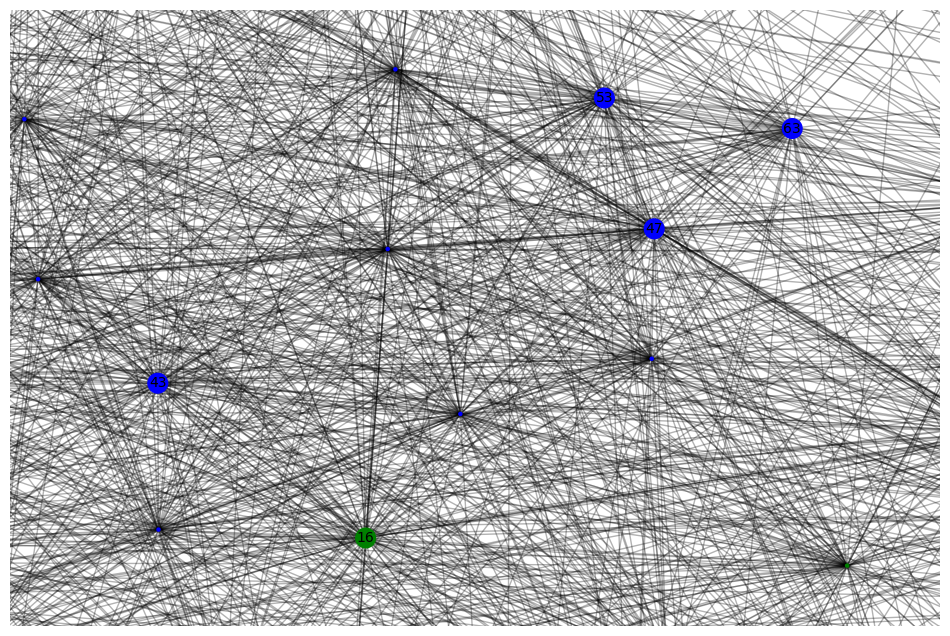

In [280]:
ns[nd]     = 200     # Increase the size of the top-5 nodes so they stand out

# Bounding box around the highlighted nodes
coords = np.array([pos[i] for i in nd])      # extract (x,y) for each highlighted node
x_min, y_min = coords.min(axis=0)            # smallest x and y among those nodes
x_max, y_max = coords.max(axis=0)            # largest x and y among those nodes
dx, dy = x_max - x_min, y_max - y_min        # width and height of that box
margin = max(dx, dy) * 0.2                   # add 20% padding so labels aren’t cut off

# 4. Draw with labels
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G, pos, node_color=colour, node_size=ns)
nx.draw_networkx_edges(G, pos, alpha=0.3)
nx.draw_networkx_labels(G, pos, font_size=10, font_color="black", labels={i: str(i) for i in nd})  # only label the highlighted nodes

plt.axis('off')
plt.xlim(x_min - margin, x_max + margin)
plt.ylim(y_min - margin, y_max + margin)
plt.show()

In [116]:
print(nd)

[16 47 63 53 43]


### Detailed Diagram of the graph around the 5 nodes with highest degree centrality

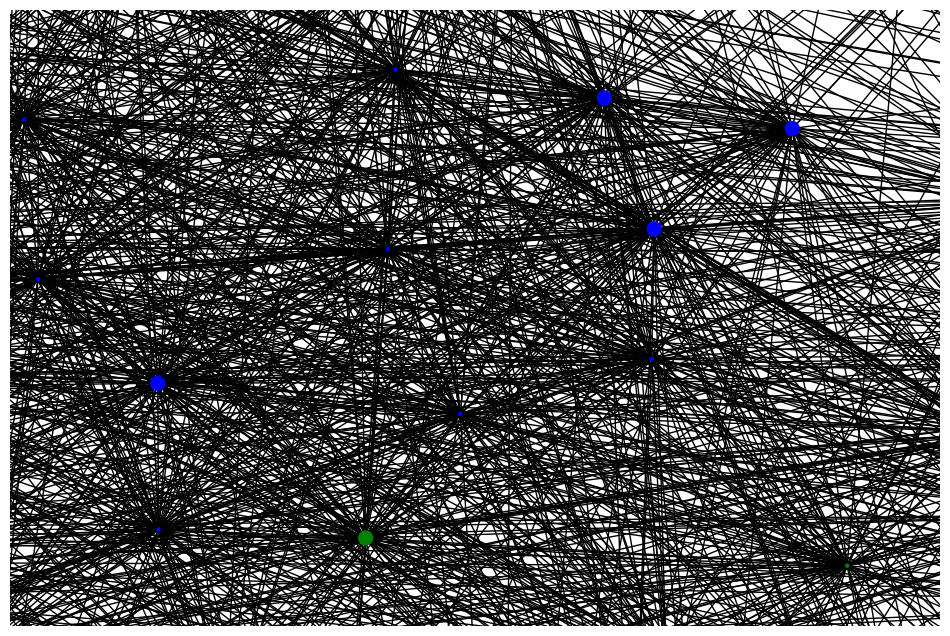

In [281]:
ns[nd]     = 100

# 3. Detailed bounding box around your highlighted nodes
coords = np.array([pos[i] for i in nd])
x_min, y_min = coords.min(axis=0)
x_max, y_max = coords.max(axis=0)

# 4. Add a margin (20% of the span)
dx = x_max - x_min
dy = y_max - y_min
margin = max(dx, dy) * 0.2

# 5. Plot with zoomed limits
plt.figure(figsize=(12, 8))
nx.draw_networkx(G, pos,
                 node_color=colour,
                 node_size=ns,
                 with_labels=False)

plt.axis('off')

# 6. Apply zoom window
plt.xlim(x_min - margin, x_max + margin)
plt.ylim(y_min - margin, y_max + margin)

plt.show()

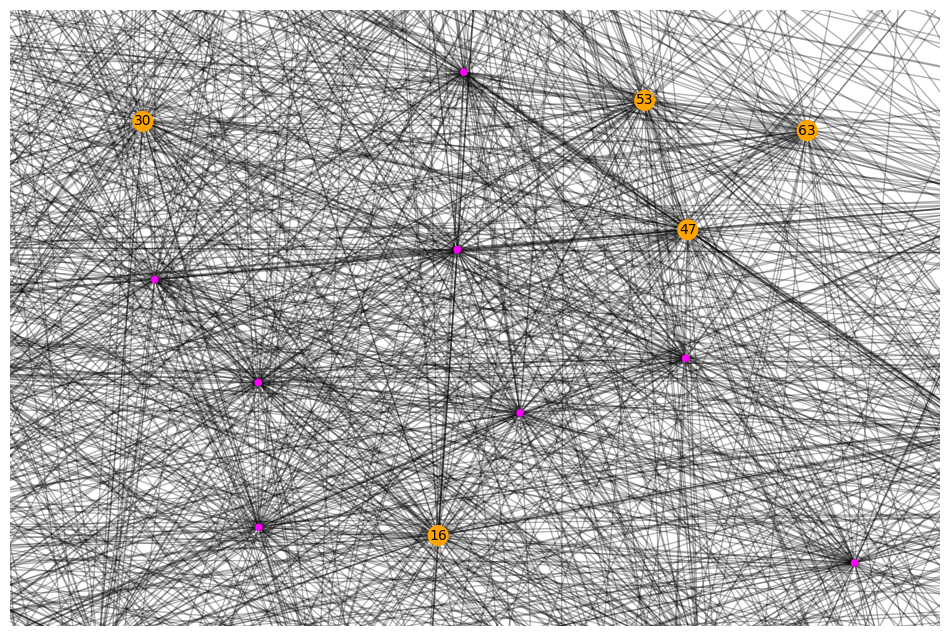

In [282]:
# 3. Compute closeness centrality
close_cent = nx.closeness_centrality(G)
nodes = list(G.nodes())
closeness_arr = np.array([close_cent[node] for node in nodes])

# 4. Find the top-5
idx_top5 = np.argsort(-closeness_arr)[:5]
top5_nodes = [nodes[i] for i in idx_top5]

# 5. Prepare color & size arrays
n = G.number_of_nodes()
colors = ['magenta'] * n
sizes  = [20] * n
for i, node in enumerate(nodes):
    if node in top5_nodes:
        colors[i] = 'orange'
        sizes[i]  = 200

# 6. Compute zoom box around those 5 nodes
coords = np.array([pos[node] for node in top5_nodes])
x_min, y_min = coords.min(axis=0)
x_max, y_max = coords.max(axis=0)
margin = max(x_max - x_min, y_max - y_min) * 0.2

# 7. Draw
plt.figure(figsize=(12,8))
nx.draw_networkx_nodes(G, pos, node_color=colors, node_size=sizes)
nx.draw_networkx_edges(G, pos, alpha=0.3)
nx.draw_networkx_labels(
    G,
    pos,
    labels={node: str(node) for node in top5_nodes},
    font_size=10
)
plt.axis('off')
plt.xlim(x_min - margin, x_max + margin)
plt.ylim(y_min - margin, y_max + margin)
plt.show()

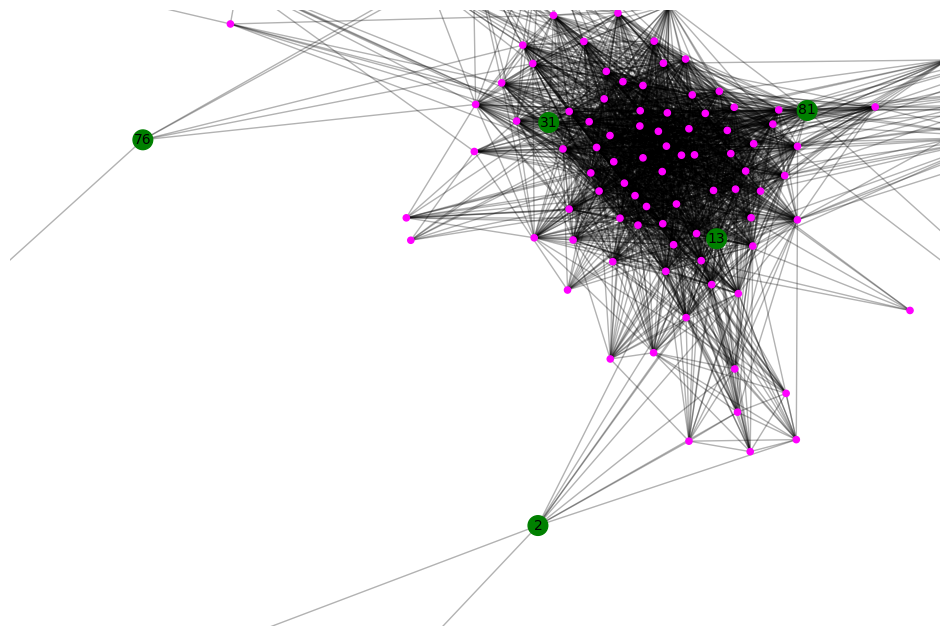

In [256]:
# 3. Compute betweenness centrality
betw_cent = nx.betweenness_centrality(G)
nodes = list(G.nodes())
betw_arr = np.array([betw_cent[node] for node in nodes])

# 4. Find the top-5
idx_top5 = np.argsort(-betw_arr)[:5]
top5_nodes = [nodes[i] for i in idx_top5]

# 5. Prepare color & size arrays
n = G.number_of_nodes()
colors = ['magenta'] * n
sizes  = [20] * n
for i, node in enumerate(nodes):
    if node in top5_nodes:
        colors[i] = 'green'
        sizes[i]  = 200

# 6. Compute zoom box around those 5 nodes
coords = np.array([pos[node] for node in top5_nodes])
x_min, y_min = coords.min(axis=0)
x_max, y_max = coords.max(axis=0)
margin = max(x_max - x_min, y_max - y_min) * 0.2

# 7. Draw the graph highlighting betweenness hubs
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G, pos, node_color=colors, node_size=sizes)
nx.draw_networkx_edges(G, pos, alpha=0.3)
nx.draw_networkx_labels(
    G,
    pos,
    labels={node: str(node) for node in top5_nodes},
    font_size=10
)
plt.axis('off')
plt.xlim(x_min - margin, x_max + margin)
plt.ylim(y_min - margin, y_max + margin)
plt.show()

## Second Dataset

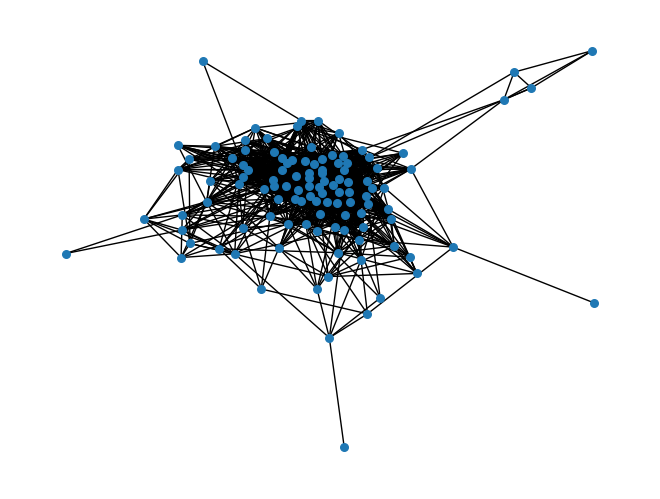

In [283]:
G2 = nx.read_weighted_edgelist('Brain3.txt')
plt.clf()
nx.draw(G2, node_size=30)
plt.show()
A2=nx.to_numpy_array(G2)

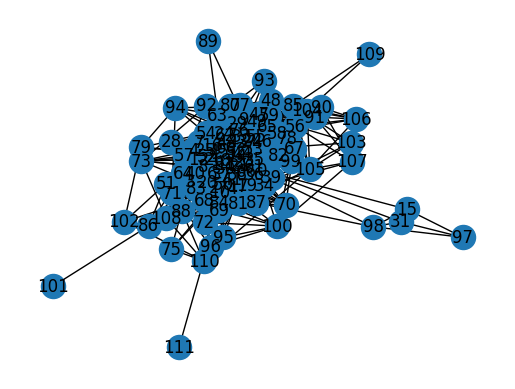

[25. 57. 11. 16. 58. 60. 19. 48. 65. 16. 65. 68. 63. 70. 60. 72. 77. 15.
 43. 53. 67. 69. 30. 62. 70. 47.  8.  3. 22.  2. 73. 67. 70. 69.  8. 65.
 62. 69. 72. 54. 62. 64. 59. 73. 73. 66. 73. 76. 71. 68. 69. 70. 71. 74.
 67. 66. 66. 23. 70. 66. 62. 65. 72. 75. 72. 69. 47. 56. 64. 69. 17. 61.
  1.  3.  8. 45.  6. 56. 18. 44. 24. 54. 35. 49. 63. 46. 16. 42. 39. 72.
 44. 49.  2.  3.  1.  3. 53. 14. 36. 10. 16. 21.  6. 14. 38. 15. 12. 20.
  8.  6.  1.  1.]


In [284]:
#Redraw network graph to order node labelling in adjacency matrix.
G2 = nx.from_numpy_array(A2)
plt.clf()
pos = nx.spring_layout(G2)
nx.draw_networkx(G2)
#nx.draw_networkx_edges(G,pos)
plt.axis('off')
#plt.savefig("pth2.png")
plt.show()

#Define some vector quantities
n2 = len(A2)
e2 = np.ones(n2)
k2 = np.dot(A2,e)
print(k)

In [285]:
# Use the eigenvalues to calculate the number of triangles in G and also
# the number of closed walks of length 4 and 5.
u2,v2 = lg.eigh(A2)
C3_2 = sum(u2**3)/6  # Number of triangles

print('Number of triangles:', C3_2)
print('Number of closed walks of length 4:',sum(u2**4))
print('Number of closed walks of length 5:',sum(u2**5))

Number of triangles: 11348.000000000024
Number of closed walks of length 4: 2665584.000000008
Number of closed walks of length 5: 103943930.00000039


In [286]:
u2

array([-7.30028405e+00, -6.76041600e+00, -6.62312827e+00, -5.73849064e+00,
       -5.65526007e+00, -5.54327763e+00, -5.30677338e+00, -5.20056903e+00,
       -5.06941532e+00, -4.73319331e+00, -4.65615892e+00, -4.49611027e+00,
       -4.48116769e+00, -4.34706268e+00, -4.18378529e+00, -4.04875833e+00,
       -3.88558501e+00, -3.68455543e+00, -3.63316210e+00, -3.56573171e+00,
       -3.42589256e+00, -3.29463104e+00, -3.23984154e+00, -3.13897287e+00,
       -3.04707290e+00, -2.84344115e+00, -2.80331848e+00, -2.71720967e+00,
       -2.64835265e+00, -2.57719607e+00, -2.47014652e+00, -2.42891618e+00,
       -2.34609979e+00, -2.24041278e+00, -2.11987759e+00, -2.09683475e+00,
       -2.02189832e+00, -1.90493495e+00, -1.79545874e+00, -1.76865292e+00,
       -1.66149369e+00, -1.64502478e+00, -1.48874780e+00, -1.42982298e+00,
       -1.38728201e+00, -1.33731954e+00, -1.26407756e+00, -1.21987798e+00,
       -1.15932486e+00, -1.07139650e+00, -1.01907378e+00, -1.00000000e+00,
       -9.52027409e-01, -

In [287]:
print("Second-largest positive eigenvalue:", u2[-2])

Second-largest positive eigenvalue: 14.37761352953025


In [288]:
v2[:,-2]

array([ 8.23453282e-02,  6.02218419e-02,  1.10139776e-01,  1.11189265e-01,
        1.95211552e-02, -3.13382993e-02,  1.14364325e-01,  8.59799061e-05,
        9.96530379e-02, -3.92812652e-02,  1.39224876e-01,  3.07904567e-02,
        6.43108049e-02,  6.91702517e-02, -1.15166232e-02,  6.71062050e-03,
       -2.64982705e-02,  1.76589406e-01, -5.80225814e-04,  7.70803187e-02,
        1.72029428e-01,  3.66600052e-02, -1.77297418e-01,  5.77303532e-03,
       -2.66630232e-02, -1.94364789e-02,  4.01800662e-02, -1.62895510e-01,
        1.13038539e-02, -4.07094378e-02,  8.90239532e-02,  6.71062050e-03,
       -4.36280275e-02, -1.70936128e-01,  1.46035709e-01,  1.76362790e-02,
        5.65482198e-02,  9.85534156e-02,  7.58950263e-02,  1.10041616e-02,
       -6.12527593e-03,  9.44293996e-02, -1.17357742e-01, -1.31271310e-01,
       -2.49297433e-02, -1.04308246e-02, -1.67360352e-01, -2.22423170e-01,
       -1.99979912e-01, -2.27968278e-01,  1.39097320e-01,  8.59236226e-02,
       -6.61219117e-03, -

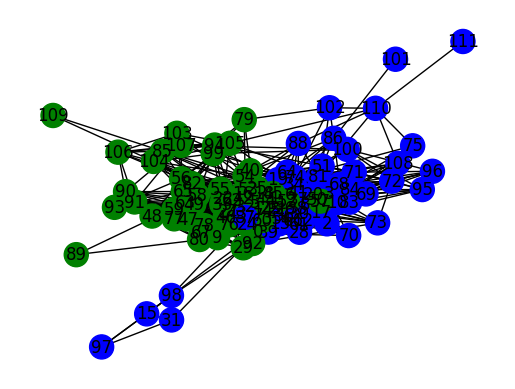

In [289]:
P2=v2[:,-2]                      # Put eigenvector here
C1_2 = np.where(P2>0)[0]          # C1 is a vector of indices of P which are positive
C2_2 = np.where(P2<=0)[0]         # C2 is a vector of indices of P which are non-positive
colour = np.tile('g',n2)        # Default colour is green
colour[C1_2] = 'b'               # Turn one partition blue
plt.clf()
nx.draw_networkx(G2,pos,node_color = colour)
plt.axis('off')
# plt.savefig('ass.png')
plt.show()

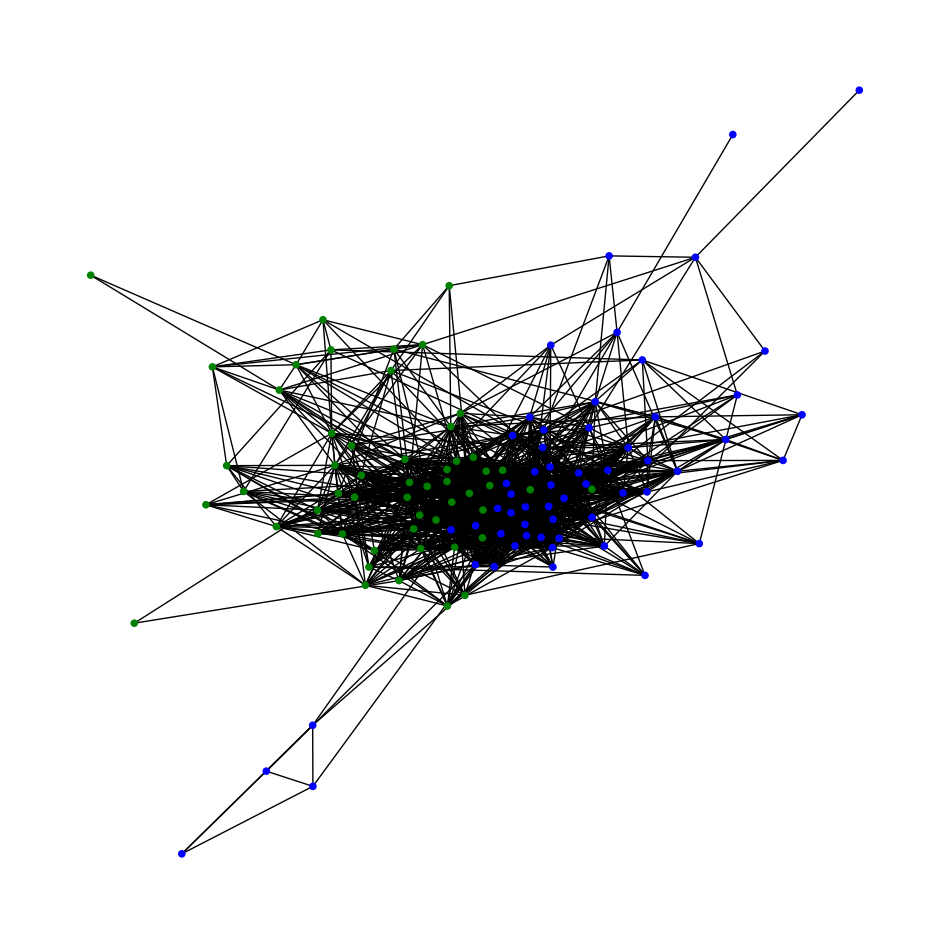

In [290]:
plt.figure(figsize=(12, 12))
plt.clf()
nx.draw_networkx(G2, pos, node_color=colour, node_size=20, with_labels=False)
plt.axis('off')
plt.show()

In [291]:
# 4) count edges within each and between
within_C1_2 = G2.subgraph(C1_2).number_of_edges()
within_C2_2 = G2.subgraph(C2_2).number_of_edges()
between = sum(
    1 for i, j in G2.edges()
    if (i in C1_2 and j in C2_2) or (i in C2_2 and j in C1_2)
)

print(f"Community 1 (|C1|={len(C1_2)}) has {within_C1_2} edges")
print(f"Community 2 (|C2|={len(C2_2)}) has {within_C2_2} edges")
print(f"Edges between communities: {between}")

Community 1 (|C1|=58) has 529 edges
Community 2 (|C2|=54) has 486 edges
Edges between communities: 525


In [292]:
total_edges2 = np.sum(A2)/2
total_edges2

1540.0

In [293]:
C_ws_2 = nx.average_clustering(G2)
print("Watts–Strogatz clustering coefficient (C):", C_ws_2)

Watts–Strogatz clustering coefficient (C): 0.5671234078337893


In [294]:
C4_2 = (np.sum(u2**4) - 2*(total_edges2) - 4*(C3_2)) / 8

print('Number of triangles (C3):', C3_2)
print("Number of squares (C4):", C4_2)

Number of triangles (C3): 11348.000000000024
Number of squares (C4): 327139.00000000105


In [295]:
m2 = np.sum(A2)/2
p2 = 2*m2/(n2*(n2-1))

# Erdős–Rényi graph metric
metrics = []
for seed in range(60):
    G_er2 = nx.erdos_renyi_graph(n2, p2, seed=seed)
    A_er2 = nx.to_numpy_array(G_er2)
    C_er2 = nx.average_clustering(G_er2)
    u_er2, v_er2 = lg.eigh(A_er2)
    C3_er2   = np.sum(u_er2**3)/6
    C4_er2   = (np.sum(u_er2**4) - 2*(np.sum(A_er2)/2) - 4*C3_er2)/8
    metrics.append({'clustering': C_er2, 'triangles': C3_er2, 'squares': C4_er2})
    
df = pd.DataFrame(metrics)

print("\n### Real vs ER Erdős–Rényi (60 samples):")
print("| Metric        | Real  | ER Avg.   |")
print("|---------------|------:|----------:|")
print(f"| Clustering    | {C_ws:.4f} | {df['clustering'].mean():.4f}   |")
print(f"| Triangles     | {int(C3_2)} | {df['triangles'].mean():.1f}   |")
print(f"| Squares       | {int(C4_2)} | {df['squares'].mean():.1f} |")


### Real vs ER Erdős–Rényi (60 samples):
| Metric        | Real  | ER Avg.   |
|---------------|------:|----------:|
| Clustering    | 0.7565 | 0.2465   |
| Triangles     | 11348 | 3420.6   |
| Squares       | 327139 | 88340.9 |


In [296]:
nd2 = np.argsort(-k2)[0:5]
colour2 = np.tile('m',n2)
ns2 = np.ones(n)*5
colour2[nd2] = 'c'
ns2[nd2]=100
print(nd2)

[ 5 14 23 21 27]


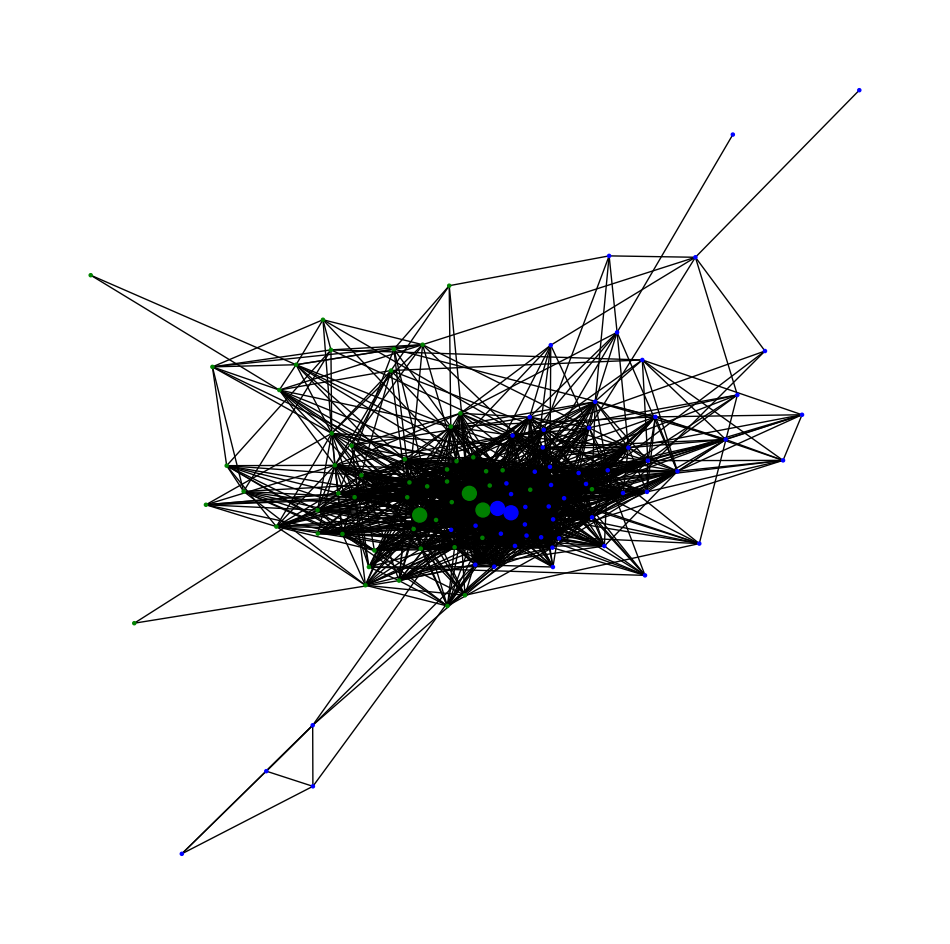

In [297]:
plt.figure(figsize=(12, 12))
plt.clf()
nx.draw_networkx(G2,pos,node_color = colour,node_size=ns2,with_labels=False)
plt.axis('off')
plt.show()

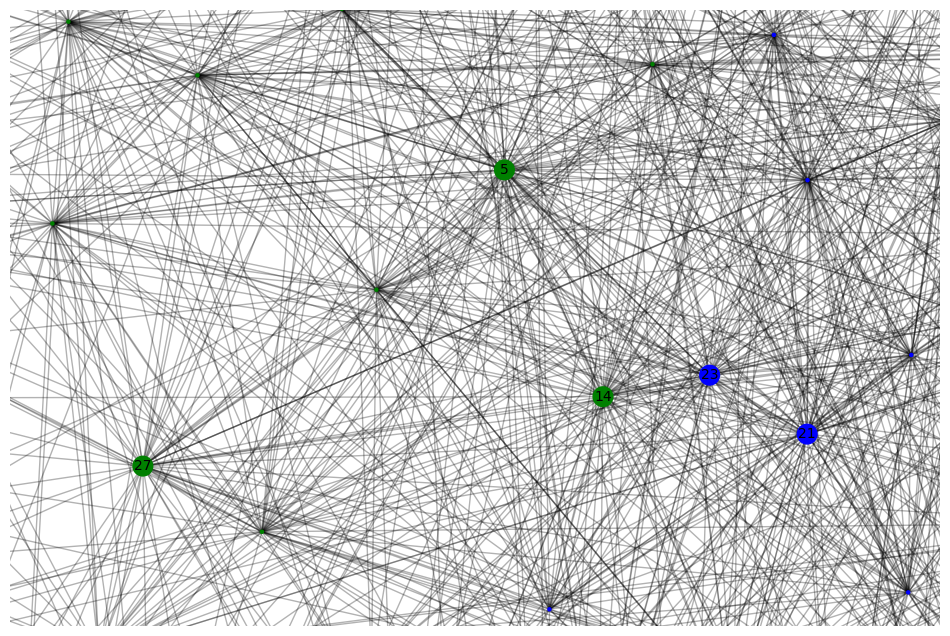

In [298]:
ns2[nd2]     = 200     # Increase the size of the top-5 nodes so they stand out

# Bounding box around the highlighted nodes
coords2 = np.array([pos[i] for i in nd2])      # extract (x,y) for each highlighted node
x_min2, y_min2 = coords2.min(axis=0)            # smallest x and y among those nodes
x_max2, y_max2 = coords2.max(axis=0)            # largest x and y among those nodes
dx2, dy2 = x_max2 - x_min2, y_max2 - y_min2        # width and height of that box
margin2 = max(dx2, dy2) * 0.2                   # add 20% padding so labels aren’t cut off

# 4. Draw with labels
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G2, pos, node_color=colour, node_size=ns2)
nx.draw_networkx_edges(G2, pos, alpha=0.3)
nx.draw_networkx_labels(G2, pos, font_size=10, font_color="black", labels={i: str(i) for i in nd2})  # only label the highlighted nodes

plt.axis('off')
plt.xlim(x_min2 - margin2, x_max2 + margin2)
plt.ylim(y_min2 - margin2, y_max2 + margin2)
plt.show()

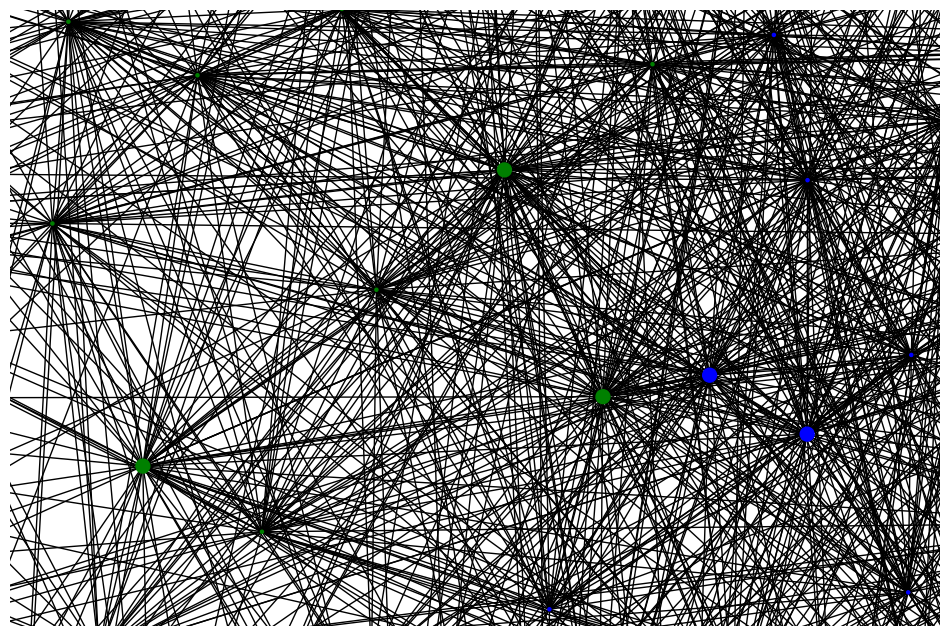

In [301]:
ns2[nd2]     = 100

# 3. Detailed bounding box around your highlighted nodes
coords2 = np.array([pos[i] for i in nd2])
x_min2, y_min2 = coords2.min(axis=0)
x_max2, y_max2 = coords2.max(axis=0)

# 4. Add a margin (20% of the span)
dx2 = x_max2 - x_min2
dy2 = y_max2 - y_min2
margin = max(dx2, dy2) * 0.2

# 5. Plot with zoomed limits
plt.figure(figsize=(12, 8))
nx.draw_networkx(G2, pos,
                 node_color=colour,
                 node_size=ns2,
                 with_labels=False)

plt.axis('off')

# 6. Apply zoom window
plt.xlim(x_min2 - margin2, x_max2 + margin2)
plt.ylim(y_min2 - margin2, y_max2 + margin2)

plt.show()

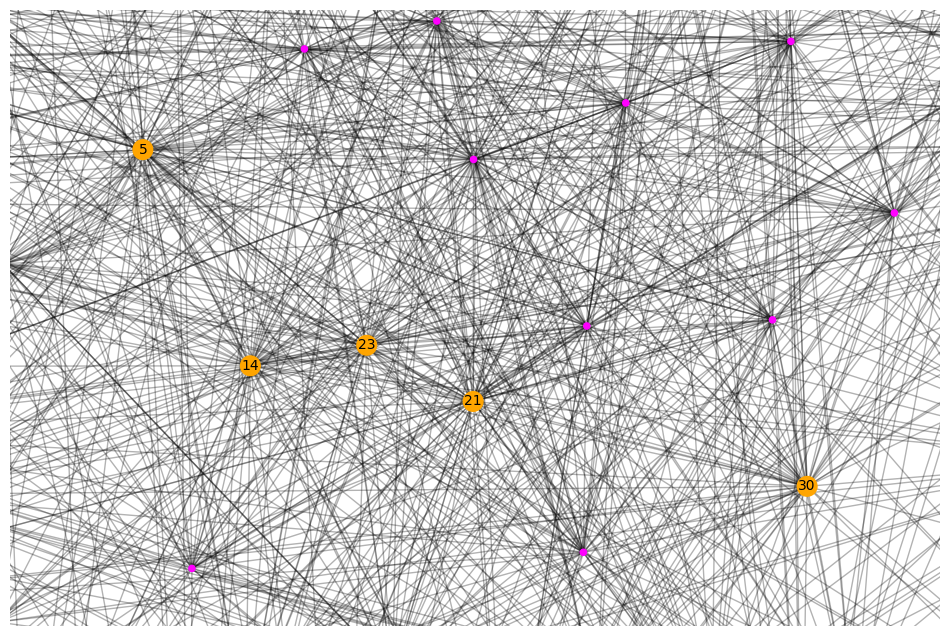

In [307]:
# 3. Compute closeness centrality
close_cent2 = nx.closeness_centrality(G2)
nodes = list(G2.nodes())
closeness_arr2 = np.array([close_cent2[node] for node in nodes])

# 4. Find the top-5
idx_top5_2 = np.argsort(-closeness_arr2)[:5]
top5_nodes_2 = [nodes[i] for i in idx_top5_2]

# 5. Prepare color & size arrays
n2 = G2.number_of_nodes()
colors = ['magenta'] * n2
sizes2  = [20] * n2
for i, node in enumerate(nodes):
    if node in top5_nodes_2:
        colors[i] = 'orange'
        sizes2[i]  = 200

# 6. Compute zoom box around those 5 nodes
coords2 = np.array([pos[node] for node in top5_nodes_2])
x_min2, y_min2 = coords2.min(axis=0)
x_max2, y_max2 = coords2.max(axis=0)
margin2 = max(x_max2 - x_min2, y_max2 - y_min2) * 0.2

# 7. Draw
plt.figure(figsize=(12,8))
nx.draw_networkx_nodes(G2, pos, node_color=colors, node_size=sizes2)
nx.draw_networkx_edges(G2, pos, alpha=0.3)
nx.draw_networkx_labels(
    G2,
    pos,
    labels={node: str(node) for node in top5_nodes_2},
    font_size=10
)
plt.axis('off')
plt.xlim(x_min2 - margin2, x_max2 + margin2)
plt.ylim(y_min2 - margin2, y_max2 + margin2)
plt.show()

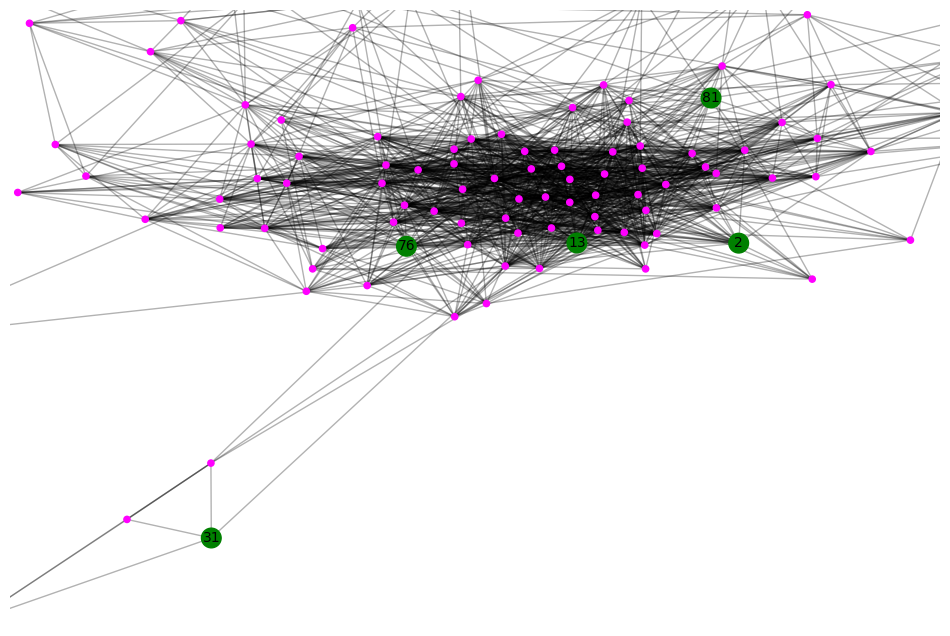

In [309]:
# 3. Compute betweenness centrality
betw_cent2 = nx.betweenness_centrality(G2)
nodes = list(G2.nodes())
betw_arr2 = np.array([betw_cent[node] for node in nodes])

# 4. Find the top-5
idx_top5_2 = np.argsort(-betw_arr2)[:5]
top5_nodes_2 = [nodes[i] for i in idx_top5_2]

# 5. Prepare color & size arrays
n2 = G2.number_of_nodes()
colors = ['magenta'] * n2
sizes2  = [20] * n2
for i, node in enumerate(nodes):
    if node in top5_nodes_2:
        colors[i] = 'green'
        sizes2[i]  = 200

# 6. Compute zoom box around those 5 nodes
coords2 = np.array([pos[node] for node in top5_nodes_2])
x_min2, y_min2 = coords2.min(axis=0)
x_max2, y_max2 = coords2.max(axis=0)
margin2 = max(x_max2 - x_min2, y_max2 - y_min2) * 0.2

# 7. Draw the graph highlighting betweenness hubs
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G2, pos, node_color=colors, node_size=sizes2)
nx.draw_networkx_edges(G2, pos, alpha=0.3)
nx.draw_networkx_labels(
    G2,
    pos,
    labels={node: str(node) for node in top5_nodes_2},
    font_size=10
)
plt.axis('off')
plt.xlim(x_min2 - margin2, x_max2 + margin2)
plt.ylim(y_min2 - margin2, y_max2 + margin2)
plt.show()